<a href="https://colab.research.google.com/github/saivaruntejamudumba/INFO-5731/blob/master/Mudumba_SelfStudy11_LSTM%2B_Word_Embedding.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Mudumba Self-Study 11

### IMDB REVIEW TEXT CLASSIFICATION with LSTM + Word Embedding

In [0]:
import pickle

In [0]:
import pandas as pd

In [0]:
with open("imdb-review.pickle", 'rb') as f:
  train, test = pickle.load(f)

In [7]:
train.head()

,text,sentiment
0,For a movie that gets no respect there sure ar...,1
1,Bizarre horror movie filled with famous faces ...,1
2,"A solid, if unremarkable film. Matthau, as Ein...",1
3,It's a strange feeling to sit alone in a theat...,1
4,"You probably all already know this by now, but...",1


In [8]:
train.tail()

,text,sentiment
24995,"My comments may be a bit of a spoiler, for wha...",0
24996,"The ""saucy"" misadventures of four au pairs who...",0
24997,"Oh, those Italians! Assuming that movies about...",0
24998,Eight academy nominations? It's beyond belief....,0
24999,"Not that I dislike childrens movies, but this ...",0


In [0]:
import matplotlib.pyplot as plt

<BarContainer object of 25000 artists>

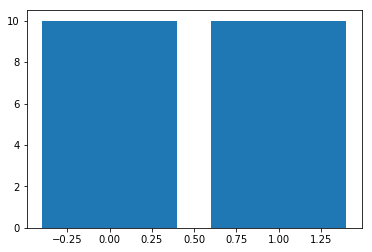

In [10]:
plt.bar(train.sentiment,  height=10)

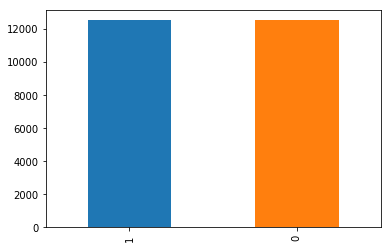

In [11]:
train.sentiment.value_counts().plot('bar')

In [12]:
from keras.preprocessing.text import Tokenizer

Using TensorFlow backend.


In [0]:
from keras.preprocessing.sequence import pad_sequences

In [0]:
import numpy as np

In [0]:
num_words=10000

In [0]:
tokenizer=Tokenizer(num_words=num_words)

In [0]:
tokenizer.fit_on_texts(train.text)

In [0]:
train_sequences=tokenizer.texts_to_sequences(train.text)
test_sequences=tokenizer.texts_to_sequences(test.text)

In [19]:
train_sequences

[[15,
  3,
  17,
  12,
  211,
  54,
  1158,
  47,
  249,
  23,
  3,
  173,
  4,
  903,
  4381,
  3559,
  15,
  11,
  1525,
  835,
  3,
  17,
  118,
  911,
  6,
  162,
  160,
  7262,
  6,
  3,
  133,
  1,
  106,
  6,
  32,
  1552,
  2032,
  103,
  15,
  1605,
  1,
  8595,
  1789,
  14,
  3,
  565,
  6259],
 [1159,
  186,
  17,
  1058,
  16,
  800,
  1586,
  18,
  2576,
  31,
  5283,
  300,
  4,
  8058,
  1314,
  14,
  3,
  181,
  18,
  640,
  7364,
  2178,
  16,
  3,
  1822,
  34,
  6,
  5,
  987,
  15,
  38,
  3348,
  31,
  1,
  5,
  605,
  1,
  136,
  16,
  5283,
  23,
  52,
  70,
  1992,
  1,
  1306,
  225,
  6,
  400,
  8596,
  6,
  1217,
  14,
  4801,
  18,
  51,
  5283,
  1098,
  80,
  3,
  944,
  4174,
  4988,
  9092,
  31,
  3,
  2024,
  2321,
  20,
  1,
  347,
  1866,
  180,
  63,
  377,
  6887,
  1,
  4716,
  583,
  3,
  9654,
  3789,
  8288,
  7916,
  2,
  9457,
  375,
  7693,
  2058,
  5340,
  23,
  3,
  9458,
  173,
  2,
  7365,
  6,
  84,
  250,
  14,
  3,
  565,
  1250,
 

In [20]:
train.text[0]

'For a movie that gets no respect there sure are a lot of memorable quotes listed for this gem. Imagine a movie where Joe Piscopo is actually funny! Maureen Stapleton is a scene stealer. The Moroni character is an absolute scream. Watch for Alan "The Skipper" Hale jr. as a police Sgt.'

In [21]:
train_sequences[0]

[15,
 3,
 17,
 12,
 211,
 54,
 1158,
 47,
 249,
 23,
 3,
 173,
 4,
 903,
 4381,
 3559,
 15,
 11,
 1525,
 835,
 3,
 17,
 118,
 911,
 6,
 162,
 160,
 7262,
 6,
 3,
 133,
 1,
 106,
 6,
 32,
 1552,
 2032,
 103,
 15,
 1605,
 1,
 8595,
 1789,
 14,
 3,
 565,
 6259]

In [22]:
tokenizer.index_word

{1: 'the',
 2: 'and',
 3: 'a',
 4: 'of',
 5: 'to',
 6: 'is',
 7: 'br',
 8: 'in',
 9: 'it',
 10: 'i',
 11: 'this',
 12: 'that',
 13: 'was',
 14: 'as',
 15: 'for',
 16: 'with',
 17: 'movie',
 18: 'but',
 19: 'film',
 20: 'on',
 21: 'not',
 22: 'you',
 23: 'are',
 24: 'his',
 25: 'have',
 26: 'he',
 27: 'be',
 28: 'one',
 29: 'all',
 30: 'at',
 31: 'by',
 32: 'an',
 33: 'they',
 34: 'who',
 35: 'so',
 36: 'from',
 37: 'like',
 38: 'her',
 39: 'or',
 40: 'just',
 41: 'about',
 42: "it's",
 43: 'out',
 44: 'if',
 45: 'has',
 46: 'some',
 47: 'there',
 48: 'what',
 49: 'good',
 50: 'more',
 51: 'when',
 52: 'very',
 53: 'up',
 54: 'no',
 55: 'time',
 56: 'she',
 57: 'even',
 58: 'my',
 59: 'would',
 60: 'which',
 61: 'only',
 62: 'story',
 63: 'really',
 64: 'see',
 65: 'their',
 66: 'had',
 67: 'can',
 68: 'were',
 69: 'me',
 70: 'well',
 71: 'than',
 72: 'we',
 73: 'much',
 74: 'been',
 75: 'bad',
 76: 'get',
 77: 'will',
 78: 'do',
 79: 'also',
 80: 'into',
 81: 'people',
 82: 'other',
 8

In [0]:
dict1=tokenizer.index_word

In [24]:
tokenizer.index_word.items()

dict_items([(1, 'the'), (2, 'and'), (3, 'a'), (4, 'of'), (5, 'to'), (6, 'is'), (7, 'br'), (8, 'in'), (9, 'it'), (10, 'i'), (11, 'this'), (12, 'that'), (13, 'was'), (14, 'as'), (15, 'for'), (16, 'with'), (17, 'movie'), (18, 'but'), (19, 'film'), (20, 'on'), (21, 'not'), (22, 'you'), (23, 'are'), (24, 'his'), (25, 'have'), (26, 'he'), (27, 'be'), (28, 'one'), (29, 'all'), (30, 'at'), (31, 'by'), (32, 'an'), (33, 'they'), (34, 'who'), (35, 'so'), (36, 'from'), (37, 'like'), (38, 'her'), (39, 'or'), (40, 'just'), (41, 'about'), (42, "it's"), (43, 'out'), (44, 'if'), (45, 'has'), (46, 'some'), (47, 'there'), (48, 'what'), (49, 'good'), (50, 'more'), (51, 'when'), (52, 'very'), (53, 'up'), (54, 'no'), (55, 'time'), (56, 'she'), (57, 'even'), (58, 'my'), (59, 'would'), (60, 'which'), (61, 'only'), (62, 'story'), (63, 'really'), (64, 'see'), (65, 'their'), (66, 'had'), (67, 'can'), (68, 'were'), (69, 'me'), (70, 'well'), (71, 'than'), (72, 'we'), (73, 'much'), (74, 'been'), (75, 'bad'), (76, '

In [0]:
list1=list(tokenizer.index_word.items())

In [26]:
list1[:20]

[(1, 'the'),
 (2, 'and'),
 (3, 'a'),
 (4, 'of'),
 (5, 'to'),
 (6, 'is'),
 (7, 'br'),
 (8, 'in'),
 (9, 'it'),
 (10, 'i'),
 (11, 'this'),
 (12, 'that'),
 (13, 'was'),
 (14, 'as'),
 (15, 'for'),
 (16, 'with'),
 (17, 'movie'),
 (18, 'but'),
 (19, 'film'),
 (20, 'on')]

In [27]:
train_sequences

[[15,
  3,
  17,
  12,
  211,
  54,
  1158,
  47,
  249,
  23,
  3,
  173,
  4,
  903,
  4381,
  3559,
  15,
  11,
  1525,
  835,
  3,
  17,
  118,
  911,
  6,
  162,
  160,
  7262,
  6,
  3,
  133,
  1,
  106,
  6,
  32,
  1552,
  2032,
  103,
  15,
  1605,
  1,
  8595,
  1789,
  14,
  3,
  565,
  6259],
 [1159,
  186,
  17,
  1058,
  16,
  800,
  1586,
  18,
  2576,
  31,
  5283,
  300,
  4,
  8058,
  1314,
  14,
  3,
  181,
  18,
  640,
  7364,
  2178,
  16,
  3,
  1822,
  34,
  6,
  5,
  987,
  15,
  38,
  3348,
  31,
  1,
  5,
  605,
  1,
  136,
  16,
  5283,
  23,
  52,
  70,
  1992,
  1,
  1306,
  225,
  6,
  400,
  8596,
  6,
  1217,
  14,
  4801,
  18,
  51,
  5283,
  1098,
  80,
  3,
  944,
  4174,
  4988,
  9092,
  31,
  3,
  2024,
  2321,
  20,
  1,
  347,
  1866,
  180,
  63,
  377,
  6887,
  1,
  4716,
  583,
  3,
  9654,
  3789,
  8288,
  7916,
  2,
  9457,
  375,
  7693,
  2058,
  5340,
  23,
  3,
  9458,
  173,
  2,
  7365,
  6,
  84,
  250,
  14,
  3,
  565,
  1250,
 

In [0]:
length=[]
for i in range(len(train_sequences)):
  length.append(len(train_sequences[i]))

In [29]:
length[:20]

[47,
 148,
 51,
 393,
 136,
 88,
 114,
 116,
 439,
 55,
 56,
 322,
 78,
 613,
 114,
 44,
 128,
 134,
 179,
 139]

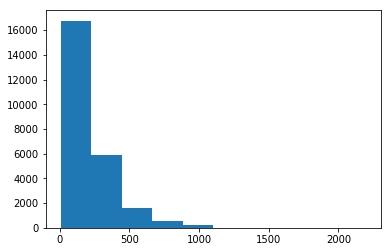

In [30]:
plt.hist(length)
plt.show()

In [0]:
#To make an equal token length for all the sequences
maxlen= 500

In [0]:
x_train=pad_sequences(train_sequences, maxlen=maxlen)

In [33]:
x_train

array([[   0,    0,    0, ...,    3,  565, 6259],
       [   0,    0,    0, ...,  297,  238,   36],
       [   0,    0,    0, ...,    5, 8926,    1],
       ...,
       [   0,    0,    0, ...,  155,    7,    7],
       [   0,    0,    0, ...,    1, 3476, 1873],
       [   0,    0,    0, ...,  302,  339,  155]], dtype=int32)

In [34]:
x_train.shape

(25000, 500)

In [0]:
x_test=pad_sequences(test_sequences, maxlen=maxlen)

In [36]:
x_test

array([[   0,    0,    0, ...,  110,  207,  938],
       [   0,    0,    0, ...,   70,   90,  662],
       [   0,    0,    0, ...,    7,  651,  825],
       ...,
       [   0,    0,    0, ...,    9, 3532,  148],
       [   0,    0,    0, ...,   67, 3467,   16],
       [   0,    0,    0, ...,    4,    1,  505]], dtype=int32)

In [37]:
x_test.shape

(25000, 500)

In [0]:
y_train=train.sentiment
y_test=test.sentiment

# Word Embedding

In [0]:
import spacy

In [40]:
spacy.cli.download("en_core_web_lg")


    Linking successful
    /usr/local/lib/python3.6/dist-packages/en_core_web_lg -->
    /usr/local/lib/python3.6/dist-packages/spacy/data/en_core_web_lg

    You can now load the model via spacy.load('en_core_web_lg')



In [0]:
nlp=spacy.load("en_core_web_lg")

In [42]:
nlp.vocab["the"].vector

array([ 2.7204e-01, -6.2030e-02, -1.8840e-01,  2.3225e-02, -1.8158e-02,
        6.7192e-03, -1.3877e-01,  1.7708e-01,  1.7709e-01,  2.5882e+00,
       -3.5179e-01, -1.7312e-01,  4.3285e-01, -1.0708e-01,  1.5006e-01,
       -1.9982e-01, -1.9093e-01,  1.1871e+00, -1.6207e-01, -2.3538e-01,
        3.6640e-03, -1.9156e-01, -8.5662e-02,  3.9199e-02, -6.6449e-02,
       -4.2090e-02, -1.9122e-01,  1.1679e-02, -3.7138e-01,  2.1886e-01,
        1.1423e-03,  4.3190e-01, -1.4205e-01,  3.8059e-01,  3.0654e-01,
        2.0167e-02, -1.8316e-01, -6.5186e-03, -8.0549e-03, -1.2063e-01,
        2.7507e-02,  2.9839e-01, -2.2896e-01, -2.2882e-01,  1.4671e-01,
       -7.6301e-02, -1.2680e-01, -6.6651e-03, -5.2795e-02,  1.4258e-01,
        1.5610e-01,  5.5510e-02, -1.6149e-01,  9.6290e-02, -7.6533e-02,
       -4.9971e-02, -1.0195e-02, -4.7641e-02, -1.6679e-01, -2.3940e-01,
        5.0141e-03, -4.9175e-02,  1.3338e-02,  4.1923e-01, -1.0104e-01,
        1.5111e-02, -7.7706e-02, -1.3471e-01,  1.1900e-01,  1.08

In [0]:
listdist=nlp.vocab["the"].vector

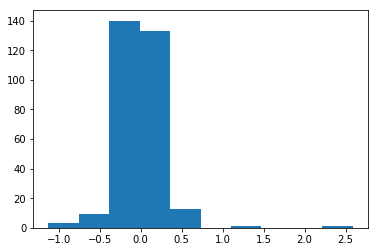

In [44]:
plt.hist(listdist)
plt.show()

In [0]:
embedding_dim=nlp.vocab.vectors_length

In [46]:
embedding_dim

300

In [47]:
nlp.vocab["for"].vector

array([-1.7224e-01,  1.8234e-01, -2.7847e-01, -8.4666e-02,  2.5442e-01,
       -1.9403e-01,  4.0686e-01,  1.5083e-01,  1.4670e-01,  2.0235e+00,
       -3.7482e-01,  3.5648e-01, -3.0890e-01, -2.2356e-01, -1.4905e-01,
       -1.3722e-01,  8.4057e-03,  1.4288e+00, -2.7068e-01,  1.3772e-01,
       -3.6068e-01, -1.0640e-01, -2.5892e-01, -2.1405e-02, -9.1887e-02,
        1.9684e-01, -7.2568e-02, -1.0205e-01,  2.4116e-01,  1.1358e-01,
       -7.8850e-02, -3.3526e-01,  1.0925e-01,  3.3524e-01,  2.7432e-01,
       -3.1051e-01, -1.0975e-01, -4.5724e-01,  3.5293e-01,  3.9174e-01,
        1.8020e-01,  5.4142e-01, -2.8704e-01, -2.5404e-01, -3.9927e-02,
        1.0899e-01, -3.5690e-02,  3.8254e-01, -1.5887e-02, -2.6144e-02,
       -1.5714e-01, -4.4737e-02,  1.4968e-02, -7.0873e-03,  8.7658e-02,
        7.7366e-03, -1.4570e-01, -6.1741e-02, -4.5388e-01,  3.0605e-01,
       -1.7014e-02, -6.3985e-02, -2.9787e-01,  2.0399e-01,  3.2647e-01,
       -2.4086e-01, -3.8758e-01,  4.2238e-01, -2.6736e-01, -2.99

In [48]:
list(tokenizer.index_word.items())[:20]

[(1, 'the'),
 (2, 'and'),
 (3, 'a'),
 (4, 'of'),
 (5, 'to'),
 (6, 'is'),
 (7, 'br'),
 (8, 'in'),
 (9, 'it'),
 (10, 'i'),
 (11, 'this'),
 (12, 'that'),
 (13, 'was'),
 (14, 'as'),
 (15, 'for'),
 (16, 'with'),
 (17, 'movie'),
 (18, 'but'),
 (19, 'film'),
 (20, 'on')]

In [49]:
list(tokenizer.index_word.items())[9950:10000]

[(9951, "day's"),
 (9952, 'ewan'),
 (9953, "murphy's"),
 (9954, 'uniquely'),
 (9955, 'wicker'),
 (9956, 'maniacal'),
 (9957, 'devastated'),
 (9958, 'lamas'),
 (9959, 'transform'),
 (9960, 'willy'),
 (9961, "ben's"),
 (9962, 'unsuccessful'),
 (9963, 'decoration'),
 (9964, 'olympia'),
 (9965, 'perfected'),
 (9966, 'mattei'),
 (9967, 'indulge'),
 (9968, 'frenchman'),
 (9969, "streisand's"),
 (9970, 'starving'),
 (9971, 'mismatched'),
 (9972, 'cambodia'),
 (9973, 'transcends'),
 (9974, 'exhausted'),
 (9975, 'bickering'),
 (9976, 'researched'),
 (9977, 'complains'),
 (9978, 'washing'),
 (9979, 'weaves'),
 (9980, 'raping'),
 (9981, 'kusturica'),
 (9982, 'lamarr'),
 (9983, 'exceedingly'),
 (9984, 'tent'),
 (9985, 'enthralled'),
 (9986, 'liza'),
 (9987, 'geeky'),
 (9988, 'sentiments'),
 (9989, 'transferred'),
 (9990, 'blends'),
 (9991, 'voters'),
 (9992, 'stevenson'),
 (9993, 'retrospect'),
 (9994, 'praying'),
 (9995, 'secluded'),
 (9996, 'crowds'),
 (9997, 'boarding'),
 (9998, 'contacts'),
 (

In [50]:
nlp.vocab["ben's"].vector

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [51]:
nlp.vocab["day's"].vector

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [52]:
nlp.vocab["geeky"].vector

array([-2.4043e-01, -6.1663e-01, -2.3805e-01,  5.7843e-01, -6.1870e-02,
        1.1892e-01,  2.2243e-01, -3.4230e-01,  1.1869e-01,  4.1971e-01,
        1.9978e-01, -5.8726e-01, -1.1081e-01, -2.5805e-01,  2.3343e-01,
        1.0274e-01, -7.1329e-02, -1.9767e-01,  5.0737e-01,  1.8361e-01,
       -1.5277e-01, -7.2729e-01, -3.5668e-01, -4.3250e-01, -1.0761e-01,
       -5.7240e-02,  3.9274e-01,  9.9208e-02,  8.6351e-02, -1.9227e-02,
       -7.6917e-02, -2.4348e-01, -1.8284e-01,  5.6699e-01,  3.1731e-01,
       -2.8889e-02, -2.1261e-01,  2.8632e-01, -1.8983e-01,  4.5418e-01,
       -5.5772e-01,  5.4248e-03,  1.7127e-01,  8.5345e-02,  6.4807e-02,
       -3.8868e-03, -1.6491e-01,  1.8607e-01,  6.7630e-01, -1.0385e-01,
        2.4447e-01, -6.5822e-01,  2.4985e-01, -3.7306e-01, -3.5386e-01,
        1.4048e-02, -1.3128e-02, -5.0264e-01,  3.6396e-01, -1.8507e-03,
        4.9241e-01, -4.9500e-01, -3.6350e-02, -2.6321e-01,  2.7196e-01,
       -3.8354e-01, -4.1603e-01,  6.4670e-02, -4.5692e-01, -1.76

In [53]:
nlp.vocab["di"].vector

array([-3.7899e-01, -3.9331e-01,  3.7368e-01, -2.9938e-01,  3.8476e-01,
        5.9452e-01,  1.2833e+00, -4.7050e-01, -5.1136e-01,  5.4157e-01,
       -7.7124e-01,  1.2739e-01, -2.9540e-01,  7.6275e-01,  6.6211e-02,
       -1.0358e-01, -2.4954e-01,  1.6417e+00,  1.5244e-03, -1.3964e-01,
        3.7021e-01, -2.1434e-01, -1.9553e-02,  8.8129e-02,  6.0085e-01,
       -2.4623e-01, -1.0618e+00, -9.1593e-02,  7.9602e-01, -9.7625e-02,
        4.1492e-01, -1.8790e-01,  7.4489e-01,  2.7204e-01, -4.2130e-01,
       -4.7512e-01, -8.2277e-02, -2.0327e-02, -3.5306e-01, -1.7411e-01,
       -1.8562e-01, -3.2354e-01, -3.9195e-02, -5.7941e-01,  4.3626e-02,
        2.7856e-01,  2.2579e-01,  2.5555e-01, -4.5266e-01, -1.6894e-01,
        3.8712e-01, -4.6106e-01,  4.0056e-01,  4.0921e-01,  1.9063e-01,
       -4.9193e-01, -2.7263e-01, -1.7892e-02, -4.0562e-01,  4.2369e-01,
       -1.0427e+00,  1.0223e+00, -1.5771e-01, -2.2844e-01, -5.6306e-01,
       -1.0239e+00, -6.7638e-01, -7.6219e-01, -1.7403e-02,  7.26

In [0]:
embedding_matrix=np.random.rand(num_words + 1, embedding_dim)

In [55]:
embedding_matrix.shape

(10001, 300)

(array([26., 22., 35., 30., 34., 24., 27., 38., 22., 42.]),
 array([0.00655712, 0.10570206, 0.20484699, 0.30399193, 0.40313687,
        0.5022818 , 0.60142674, 0.70057167, 0.79971661, 0.89886155,
        0.99800648]),
 <a list of 10 Patch objects>)

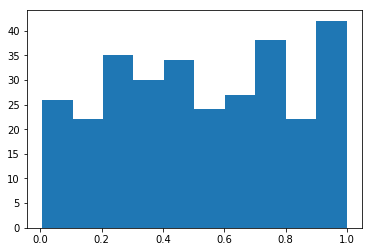

In [56]:
plt.hist(embedding_matrix[0])

In [0]:
embedding_matrix=(embedding_matrix-0.5)*4

(array([26., 22., 35., 30., 34., 24., 27., 38., 22., 42.]),
 array([-1.97377152, -1.57719178, -1.18061203, -0.78403229, -0.38745254,
         0.00912721,  0.40570695,  0.8022867 ,  1.19886645,  1.59544619,
         1.99202594]),
 <a list of 10 Patch objects>)

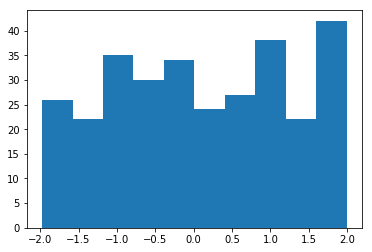

In [58]:
plt.hist(embedding_matrix[0])

In [59]:
tokenizer.word_index.items()

dict_items([('the', 1), ('and', 2), ('a', 3), ('of', 4), ('to', 5), ('is', 6), ('br', 7), ('in', 8), ('it', 9), ('i', 10), ('this', 11), ('that', 12), ('was', 13), ('as', 14), ('for', 15), ('with', 16), ('movie', 17), ('but', 18), ('film', 19), ('on', 20), ('not', 21), ('you', 22), ('are', 23), ('his', 24), ('have', 25), ('he', 26), ('be', 27), ('one', 28), ('all', 29), ('at', 30), ('by', 31), ('an', 32), ('they', 33), ('who', 34), ('so', 35), ('from', 36), ('like', 37), ('her', 38), ('or', 39), ('just', 40), ('about', 41), ("it's", 42), ('out', 43), ('if', 44), ('has', 45), ('some', 46), ('there', 47), ('what', 48), ('good', 49), ('more', 50), ('when', 51), ('very', 52), ('up', 53), ('no', 54), ('time', 55), ('she', 56), ('even', 57), ('my', 58), ('would', 59), ('which', 60), ('only', 61), ('story', 62), ('really', 63), ('see', 64), ('their', 65), ('had', 66), ('can', 67), ('were', 68), ('me', 69), ('well', 70), ('than', 71), ('we', 72), ('much', 73), ('been', 74), ('bad', 75), ('get'

In [60]:
nlp.vocab['the'].vector

array([ 2.7204e-01, -6.2030e-02, -1.8840e-01,  2.3225e-02, -1.8158e-02,
        6.7192e-03, -1.3877e-01,  1.7708e-01,  1.7709e-01,  2.5882e+00,
       -3.5179e-01, -1.7312e-01,  4.3285e-01, -1.0708e-01,  1.5006e-01,
       -1.9982e-01, -1.9093e-01,  1.1871e+00, -1.6207e-01, -2.3538e-01,
        3.6640e-03, -1.9156e-01, -8.5662e-02,  3.9199e-02, -6.6449e-02,
       -4.2090e-02, -1.9122e-01,  1.1679e-02, -3.7138e-01,  2.1886e-01,
        1.1423e-03,  4.3190e-01, -1.4205e-01,  3.8059e-01,  3.0654e-01,
        2.0167e-02, -1.8316e-01, -6.5186e-03, -8.0549e-03, -1.2063e-01,
        2.7507e-02,  2.9839e-01, -2.2896e-01, -2.2882e-01,  1.4671e-01,
       -7.6301e-02, -1.2680e-01, -6.6651e-03, -5.2795e-02,  1.4258e-01,
        1.5610e-01,  5.5510e-02, -1.6149e-01,  9.6290e-02, -7.6533e-02,
       -4.9971e-02, -1.0195e-02, -4.7641e-02, -1.6679e-01, -2.3940e-01,
        5.0141e-03, -4.9175e-02,  1.3338e-02,  4.1923e-01, -1.0104e-01,
        1.5111e-02, -7.7706e-02, -1.3471e-01,  1.1900e-01,  1.08

In [0]:
for word, i in list(tokenizer.word_index.items())[:num_words]:
  try:
    embedding_vector=nlp.vocab[word].vector
    embedding_matrix[i]=embedding_vector
  except:
    pass

In [62]:
embedding_matrix

array([[ 0.9654571 , -0.3112277 ,  0.66870771, ..., -0.99939678,
        -1.96390084,  1.09709377],
       [ 0.27204001, -0.06203   , -0.1884    , ...,  0.13015001,
        -0.18317001,  0.1323    ],
       [-0.18567   ,  0.066008  , -0.25209001, ..., -0.023452  ,
         0.12302   ,  0.3312    ],
       ...,
       [ 0.74704999, -0.22017001, -0.27197   , ..., -0.4118    ,
        -0.41327   ,  0.36833   ],
       [-0.37898999, -0.39331001,  0.37368   , ...,  0.25400999,
        -0.28420001,  0.41562   ],
       [ 0.32993001, -0.27362999, -0.18124001, ...,  0.17293   ,
         0.12616999,  0.59792   ]])

In [63]:
embedding_matrix.shape

(10001, 300)

In [0]:
from keras.models import Sequential

In [0]:
from keras.layers import Embedding, Flatten, Dense, LSTM

In [0]:
units = 32

In [0]:
model=Sequential()

In [68]:
model.add(Embedding(num_words+1, embedding_dim))
model.add(LSTM(units))
model.add(Dense(1, activation='sigmoid'))

Instructions for updating:
Colocations handled automatically by placer.


In [69]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, None, 300)         3000300   
_________________________________________________________________
lstm_1 (LSTM)                (None, 32)                42624     
_________________________________________________________________
dense_1 (Dense)              (None, 1)                 33        
Total params: 3,042,957
Trainable params: 3,042,957
Non-trainable params: 0
_________________________________________________________________


In [0]:
model.layers[0].set_weights([embedding_matrix])

In [0]:
model.layers[0].trainable=False

In [0]:
model.compile(optimizer='rmsprop',
             loss='binary_crossentropy',
             metrics=['acc'])

In [73]:
history=model.fit(x_train, y_train,
                 epochs=10,
                 batch_size=32)

Instructions for updating:
Use tf.cast instead.
Epoch 1/10
25000/25000 [==============================] - 265s 11ms/step - loss: 0.4637 - acc: 0.7818
Epoch 2/10
25000/25000 [==============================] - 262s 10ms/step - loss: 0.3341 - acc: 0.8596
Epoch 3/10
25000/25000 [==============================] - 261s 10ms/step - loss: 0.2865 - acc: 0.8820
Epoch 4/10
25000/25000 [==============================] - 261s 10ms/step - loss: 0.2555 - acc: 0.8980
Epoch 5/10
25000/25000 [==============================] - 260s 10ms/step - loss: 0.2304 - acc: 0.9074
Epoch 6/10
25000/25000 [==============================] - 261s 10ms/step - loss: 0.2096 - acc: 0.9169
Epoch 7/10
25000/25000 [==============================] - 264s 11ms/step - loss: 0.1909 - acc: 0.9256
Epoch 8/10
25000/25000 [==============================] - 266s 11ms/step - loss: 0.1739 - acc: 0.9332
Epoch 9/10
25000/25000 [==============================] - 269s 11ms/step - loss: 0.1563 - acc: 0.9399
Epoch 10/10
25000/25000 [=========